In [1]:
import time
import math
import numpy as np
import collections
from numpy import linalg as la
import json
import matplotlib.pyplot as plt 
import seaborn as sns
import networkx as nx

import pandas as pd
import random as rnd
data_path = './data/one100K_v2.json'

In [2]:
docs_path = data_path
with open(docs_path) as fp:
    lines = fp.readlines()
tweets = [l.strip().replace(' +', ' ') for l in lines]

In [3]:
print("Total numer of tweets in the corpus: {}" .format(len(tweets)))

Total numer of tweets in the corpus: 100001


In [4]:
def getRelevantInfo(tweet):
    dictRelevantInfo ={}
    data = json.loads(tweet)
    hashtags = []
    urlsList = []
    text = ''
    date = data['created_at'] ## ??? RT o no RT
    try:
        isRt=True
        isRetweet=data["retweeted_status"]
        idTweet=data["id_str"]
        text = isRetweet['text']
        username = isRetweet['user']['screen_name']
        urls = isRetweet['entities']['urls']
        rt_count = isRetweet['retweet_count']
        likes = isRetweet['favorite_count']
        id_retweet=isRetweet["id_str"]
        for h in isRetweet['entities']['hashtags']:
            hashtags.append(h['text'])
        for url in urls:
            urlsList.append(url['url'])
            
    except:
        isRt=False
        idTweet=data["id_str"]
        text = data['text']
        username = data['user']['screen_name']
        urls = data['entities']['urls']
        rt_count=data['retweet_count']
        likes = data['favorite_count']
        id_retweet=None
        for h in data['entities']['hashtags']:
            hashtags.append(h['text'])
            
        for url in urls:
            urlsList.append(url['url'])        
            
    dictRelevantInfo['tweetID'] = idTweet
    dictRelevantInfo['text'] = text
    dictRelevantInfo['username'] = username
    dictRelevantInfo['date'] = date
    dictRelevantInfo['hashtags'] = hashtags
    dictRelevantInfo['likes'] = likes
    dictRelevantInfo['rt_count'] = rt_count
    dictRelevantInfo['urlsList'] = urlsList
    dictRelevantInfo['isRetweeted'] = isRt
    dictRelevantInfo['idRt'] = id_retweet
    return dictRelevantInfo

In [5]:
cleanTweets = {}
for t in tweets:
    currentTweet=getRelevantInfo(t)
    tweetID=currentTweet['tweetID']
    
    # Orignial tweet found, overwrite if retweet exist.
   
    cleanTweets[tweetID] = currentTweet

In [6]:
print(len(set(cleanTweets)))

100000


In [7]:
def getRtGraph(cleanTweets):
    g=nx.DiGraph()
    indicee=0
    for t in cleanTweets:
        g.add_node(t)
        indicee+=1
   
    for t in cleanTweets:
       
       
        if cleanTweets[t]['isRetweeted']==True and cleanTweets[t]["idRt"] in cleanTweets:

            idTweetOriginal=cleanTweets[t]["idRt"]
            idTweetRt=cleanTweets[t]["tweetID"]
            g.add_edge(idTweetRt,idTweetOriginal)
      
    return g

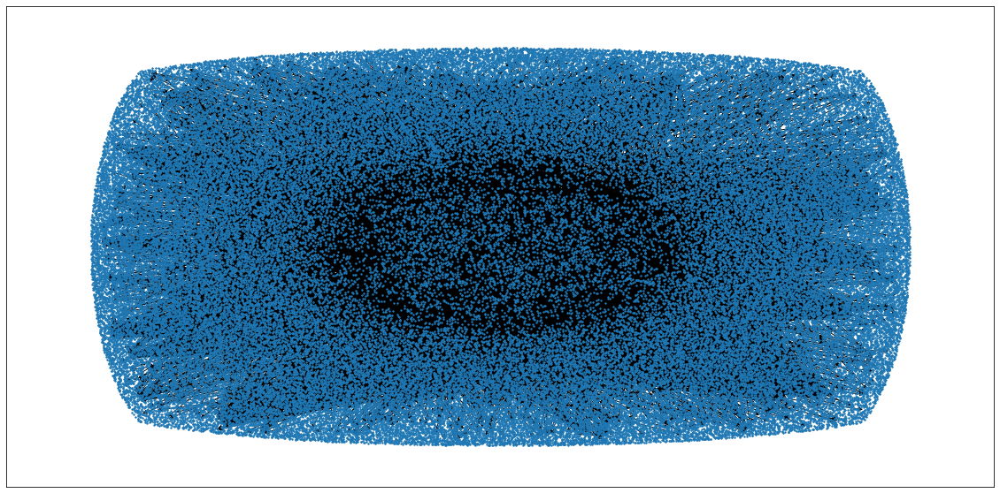

In [8]:
graph=getRtGraph(cleanTweets)

plt.figure(figsize=(20,10))
pos=nx.spring_layout(graph, iterations=5)
nx.draw_networkx_nodes(graph, pos, node_size=2)
_=nx.draw_networkx_edges(graph, pos)

In [ ]:
for x in graph.edges():
    print(x)

In [9]:
edges_shuffle=list(nx.to_edgelist(graph))

In [10]:

rnd.shuffle(edges_shuffle)

train=edges_shuffle[:int(len(edges_shuffle)*0.8)]
test=edges_shuffle[int(len(edges_shuffle)*0.8):]

In [11]:
print(len(edges_shuffle))
print(len(test))
print(len(train))

9028
1806
7222


In [ ]:

print(len(pr.items()))
print(len(set(graph.nodes())))

In [12]:
#### PAGE RANK
pr = nx.pagerank(graph)
contador_magico=0

pr2=dict(sorted(pr.items(), key=lambda item: item[1] , reverse=True))
for x in pr2:
    try: 
        
        print(cleanTweets[x])
        print(x)
        print(pr2[x])
        print()
    except:
        contador_magico+=1
        
print(contador_magico)

{'tweetID': '1334886017585786881', 'text': 'Trump’s not running in 2024. Once the countless atrocities he committed while in office are fully exposed, the only… https://t.co/CIXZdXcu5S', 'username': 'funder', 'date': 'Fri Dec 04 15:43:22 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': ['https://t.co/CIXZdXcu5S'], 'isRetweeted': False, 'idRt': None}
1334886017585786881
0.0034073572982016736

{'tweetID': '1334890209771663363', 'text': 'Dr. Fauci tells NBC that he\'s agreed to be Joe Biden\'s chief medical adviser: "I said yes right on the spot."', 'username': 'kylegriffin1', 'date': 'Fri Dec 04 16:00:01 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': [], 'isRetweeted': False, 'idRt': None}
1334890209771663363
0.0033916618442016958

{'tweetID': '1334885920890359811', 'text': 'Trump’s legal team presented details to Nevada, claiming large numbers of voter irregularities. Newsmax TV’s… https://t.co/6moLCvRTXY', 'username': 'newsmax', 'date': 'Fri Dec 04


{'tweetID': '1334889490335330307', 'text': "Biden: 'A Black Woman Will Become President Over My Dead Body' | The Babylon Bee https://t.co/ZQNXdoW6RJ", 'username': 'StacyHerndon10', 'date': 'Fri Dec 04 15:57:10 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': ['https://t.co/ZQNXdoW6RJ'], 'isRetweeted': False, 'idRt': None}
1334889490335330307
1.713923420640814e-05

{'tweetID': '1334889494336729091', 'text': 'https://t.co/ltva3jKHmS\n\n#News RA\nHas #Trump already won? Is the evidence of #electionfraud admissible?', 'username': 'brucekenneway', 'date': 'Fri Dec 04 15:57:11 0000 2020', 'hashtags': ['News', 'Trump', 'electionfraud'], 'likes': 0, 'rt_count': 0, 'urlsList': ['https://t.co/ltva3jKHmS'], 'isRetweeted': False, 'idRt': None}
1334889494336729091
1.713923420640814e-05

{'tweetID': '1334889498359029760', 'text': '10) Especially if he will continue to hammer them - as Mr. Trump prospectively runs for President again over the ne… https://t.co/fMhXgyJeUc', 'username

1334885973998518272
9.291507206419017e-06

{'tweetID': '1334885974015422464', 'text': 'Rolling in their graves!', 'username': 'candtalan', 'date': 'Fri Dec 04 15:43:11 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': [], 'isRetweeted': False, 'idRt': None}
1334885974015422464
9.291507206419017e-06

{'tweetID': '1334885974166351872', 'text': 'President Trump is very smart man! He knew! https://t.co/gAT1U8U22P', 'username': 'BradinW', 'date': 'Fri Dec 04 15:43:11 0000 2020', 'hashtags': [], 'likes': 1, 'rt_count': 1, 'urlsList': ['https://t.co/gAT1U8U22P'], 'isRetweeted': True, 'idRt': '1334881979687464960'}
1334885974166351872
9.291507206419017e-06

{'tweetID': '1334885974027988992', 'text': 'During a CNN interview, Joe Biden ‘joked’ that, “I’ll develop some disease and say I have to resign” if he disagree… https://t.co/TE4PXMGR4r', 'username': 'PrisonPlanet', 'date': 'Fri Dec 04 15:43:11 0000 2020', 'hashtags': [], 'likes': 31, 'rt_count': 8, 'urlsList': ['https://t.c

{'tweetID': '1334886085319667713', 'text': 'DONALD TRUMP IS A TRAITOR.\n\nI’ll tweet this in all caps every day he stays in office. Why? Because he’ll never conc… https://t.co/mbyKzdUOkS', 'username': 'WalshFreedom', 'date': 'Fri Dec 04 15:43:38 0000 2020', 'hashtags': [], 'likes': 1382, 'rt_count': 265, 'urlsList': ['https://t.co/mbyKzdUOkS'], 'isRetweeted': True, 'idRt': '1334875076232155138'}
1334886085319667713
9.291507206419017e-06

{'tweetID': '1334886085462274050', 'text': "It's Friday, December 4th - and Joe Biden is still not the President of the United States.", 'username': 'EmeraldRobinson', 'date': 'Fri Dec 04 15:43:38 0000 2020', 'hashtags': [], 'likes': 8370, 'rt_count': 1433, 'urlsList': [], 'isRetweeted': True, 'idRt': '1334852631437717514'}
1334886085462274050
9.291507206419017e-06

{'tweetID': '1334886085470552065', 'text': 'The “Bank Heist tape changes the result in Georgia. \n\nThe State Legislature has no choice but to assume its powers… https://t.co/aMKahD7J1G', '

9.291507206419017e-06

{'tweetID': '1334886195843764224', 'text': 'This is the moment from the GA election hearing that everyone is going to be talking about 👇👇👇\n\nhttps://t.co/Y2CY6JubrQ', 'username': 'dbongino', 'date': 'Fri Dec 04 15:44:04 0000 2020', 'hashtags': [], 'likes': 38724, 'rt_count': 12997, 'urlsList': ['https://t.co/Y2CY6JubrQ'], 'isRetweeted': True, 'idRt': '1334577741384052736'}
1334886195843764224
9.291507206419017e-06

{'tweetID': '1334886196095410178', 'text': '🚨🚨BREAKING: Wisconsin Supreme Court DENIES Republican petition to bring an original action in the state Supreme Cou… https://t.co/avZy1efMoe', 'username': 'marceelias', 'date': 'Fri Dec 04 15:44:04 0000 2020', 'hashtags': [], 'likes': 11697, 'rt_count': 2301, 'urlsList': ['https://t.co/avZy1efMoe'], 'isRetweeted': True, 'idRt': '1334633220684574721'}
1334886196095410178
9.291507206419017e-06

{'tweetID': '1334886195961147393', 'text': "For those of you who don't know what TeamViewer is, it's a program that a

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)





{'tweetID': '1334887744116457472', 'text': "@Twitter &amp; @TwitterSupport:\n\nI call on you to take down this Tweet and Suspend Trump's account until at least Jan.… https://t.co/vgmYbX16Oc", 'username': 'Matt4VA', 'date': 'Fri Dec 04 15:50:13 0000 2020', 'hashtags': [], 'likes': 34, 'rt_count': 21, 'urlsList': ['https://t.co/vgmYbX16Oc'], 'isRetweeted': True, 'idRt': '1334853131402883078'}
1334887744116457472
9.291507206419017e-06

{'tweetID': '1334887744280162304', 'text': 'He is keeping up the election fraud charade, with the help of his enablers, to continue the grift, to continue flee… https://t.co/E8xvMOVQG2', 'username': 'ananavarro', 'date': 'Fri Dec 04 15:50:13 0000 2020', 'hashtags': [], 'likes': 1097, 'rt_count': 198, 'urlsList': ['https://t.co/E8xvMOVQG2'], 'isRetweeted': True, 'idRt': '1334881809583255557'}
1334887744280162304
9.291507206419017e-06

{'tweetID': '1334887744305307651', 'text': '“I want to assure you how proud I am not only to receive the award; I’m even pr

{'tweetID': '1334887867907272708', 'text': "@MikeBalsamo1 @ZekeJMiller In each court, Trump's lawyers swear that there are no allegations of fraud, they presen… https://t.co/9TerPjLnXa", 'username': 'Deborahw37', 'date': 'Fri Dec 04 15:50:43 0000 2020', 'hashtags': [], 'likes': 230, 'rt_count': 30, 'urlsList': ['https://t.co/9TerPjLnXa'], 'isRetweeted': True, 'idRt': '1334606031008182274'}
1334887867907272708
9.291507206419017e-06

{'tweetID': '1334887867869442053', 'text': "Woodward and Bernstein weigh in on Trump's legacy - CNN Politics https://t.co/jjUmdRH2e2", 'username': 'lolonurse1', 'date': 'Fri Dec 04 15:50:43 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': ['https://t.co/jjUmdRH2e2'], 'isRetweeted': False, 'idRt': None}
1334887867869442053
9.291507206419017e-06

{'tweetID': '1334887867919679489', 'text': 'Biden will resign within 30 days IF he is to become president', 'username': 'Ocitman', 'date': 'Fri Dec 04 15:50:43 0000 2020', 'hashtags': [], 'likes': 0,

9.291507206419017e-06

{'tweetID': '1334887991500828673', 'text': 'GEORGIA🚨\n\nA 20-year poll manager talks about the most *UNUSUAL* batch of ballots she has ever seen❗️\n\n"An overwhelm… https://t.co/7oLYlrdAHT', 'username': 'KanekoaTheGreat', 'date': 'Fri Dec 04 15:51:12 0000 2020', 'hashtags': [], 'likes': 1560, 'rt_count': 815, 'urlsList': ['https://t.co/7oLYlrdAHT'], 'isRetweeted': True, 'idRt': '1334679651843624960'}
1334887991500828673
9.291507206419017e-06

{'tweetID': '1334887991333031936', 'text': 'Arrest #RubyFreeman and her Supervisor Daughter #ShaeFreeman NOW ⛓ \n\nThey used the excuse of broken pipe to kick ev… https://t.co/3PARphWTcT', 'username': 'LVNancy', 'date': 'Fri Dec 04 15:51:12 0000 2020', 'hashtags': ['RubyFreeman', 'ShaeFreeman'], 'likes': 325, 'rt_count': 229, 'urlsList': ['https://t.co/3PARphWTcT'], 'isRetweeted': True, 'idRt': '1334875237947645953'}
1334887991333031936
9.291507206419017e-06

{'tweetID': '1334887991161053185', 'text': "Thanks @GOP US breaks 

1334888113026592776
9.291507206419017e-06

{'tweetID': '1334888113181691904', 'text': 'Agreed 👇👇👇', 'username': 'gore_won', 'date': 'Fri Dec 04 15:51:41 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': [], 'isRetweeted': False, 'idRt': None}
1334888113181691904
9.291507206419017e-06

{'tweetID': '1334888113169174529', 'text': 'Ga. Gov Kemp forced to call for ‘signature audit’ after Trump legal team presents shocking footage… https://t.co/6HyyU8rqBH', 'username': 'gldbug', 'date': 'Fri Dec 04 15:51:41 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': ['https://t.co/6HyyU8rqBH'], 'isRetweeted': False, 'idRt': None}
1334888113169174529
9.291507206419017e-06

{'tweetID': '1334888113332776960', 'text': '@GOP @Perduesenate @KLoeffler Can not WAIT for Dr. Jill Biden.', 'username': 'LynnoVen', 'date': 'Fri Dec 04 15:51:41 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': [], 'isRetweeted': False, 'idRt': None}
1334888113332776960
9.2915072064

9.291507206419017e-06

{'tweetID': '1334888224611848192', 'text': 'Unbelievable...', 'username': 'owlhawn', 'date': 'Fri Dec 04 15:52:08 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': [], 'isRetweeted': False, 'idRt': None}
1334888224611848192
9.291507206419017e-06

{'tweetID': '1334888224662167553', 'text': 'Under the DOJ regulations, Barr had to find (and Durham apparently agreed) that there is need for additional crimin… https://t.co/B0rI1NqClp', 'username': 'JonathanTurley', 'date': 'Fri Dec 04 15:52:08 0000 2020', 'hashtags': [], 'likes': 413, 'rt_count': 118, 'urlsList': ['https://t.co/B0rI1NqClp'], 'isRetweeted': True, 'idRt': '1334866651234398211'}
1334888224662167553
9.291507206419017e-06

{'tweetID': '1334888225664589829', 'text': 'The Georgia middle of the night theft of thousands of votes changes everything.\n\nWatch it and Biden is not-elect an… https://t.co/srMz0jsTPs', 'username': 'RudyGiuliani', 'date': 'Fri Dec 04 15:52:08 0000 2020', 'hashtags': []

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




9.291507206419017e-06

{'tweetID': '1334889782501990403', 'text': 'NEW VIDEO Shows Anti-Trump Georgia Ballot Counter Ruby Freeman with Piles of Ballots, Walking Past Boxes of Ballots… https://t.co/y1NDPLQkqR', 'username': 'JoeRiley0311KAG', 'date': 'Fri Dec 04 15:58:19 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 1, 'urlsList': ['https://t.co/y1NDPLQkqR'], 'isRetweeted': True, 'idRt': '1334889647529484289'}
1334889782501990403
9.291507206419017e-06

{'tweetID': '1334889782393118723', 'text': '@ROBERTPATRIO Joe Biden reminds me of a sleazy used car salesman.  He has been a fraud his entire life.', 'username': 'BarbaraThayer1', 'date': 'Fri Dec 04 15:58:19 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': [], 'isRetweeted': False, 'idRt': None}
1334889782393118723
9.291507206419017e-06

{'tweetID': '1334889782657355777', 'text': 'Biden wants Americans to wear a mask for 100 days. Who’s in?', 'username': 'rogertansey', 'date': 'Fri Dec 04 15:58:19 0000 2020', 'has

{'tweetID': '1334889897396678656', 'text': 'Agree with you', 'username': 'Jack32981035', 'date': 'Fri Dec 04 15:58:47 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': [], 'isRetweeted': False, 'idRt': None}
1334889897396678656
9.291507206419017e-06

{'tweetID': '1334889897409343489', 'text': 'BREAKING HUGE: Trump Team Has Dominion Machine from Small Georgia County - Shows Votes Flipped from Trump to Biden https://t.co/sPtjOQt8ZR', 'username': 'JamesPidd', 'date': 'Fri Dec 04 15:58:47 0000 2020', 'hashtags': [], 'likes': 72, 'rt_count': 47, 'urlsList': ['https://t.co/sPtjOQt8ZR'], 'isRetweeted': True, 'idRt': '1334865376685899777'}
1334889897409343489
9.291507206419017e-06

{'tweetID': '1334889897598066688', 'text': 'Whoops. The latest legal filing from former Trump attorney Sidney Powell in her Georgia lawsuit accuses Dominion vo… https://t.co/6TQ5zGRL7T', 'username': 'bluestein', 'date': 'Fri Dec 04 15:58:47 0000 2020', 'hashtags': [], 'likes': 4096, 'rt_count': 1103

1334890018167373825
9.291507206419017e-06

{'tweetID': '1334890018289180675', 'text': 'Mary Trump on “The View” just said that “Trump hasn’t transformed the GOP as much as he’s revealed it’s true nature… https://t.co/H72d2DoGgW', 'username': 'Truthlover81', 'date': 'Fri Dec 04 15:59:16 0000 2020', 'hashtags': [], 'likes': 23772, 'rt_count': 3289, 'urlsList': ['https://t.co/H72d2DoGgW'], 'isRetweeted': True, 'idRt': '1334543483470811136'}
1334890018289180675
9.291507206419017e-06

{'tweetID': '1334890018234621952', 'text': 'Take note of the number of GOP RINOS who said nothing about election fraud for the last 30 days &amp; then broke their… https://t.co/C2bSLaQIM9', 'username': 'EmeraldRobinson', 'date': 'Fri Dec 04 15:59:16 0000 2020', 'hashtags': [], 'likes': 2469, 'rt_count': 824, 'urlsList': ['https://t.co/C2bSLaQIM9'], 'isRetweeted': True, 'idRt': '1334884400396464144'}
1334890018234621952
9.291507206419017e-06

{'tweetID': '1334890018360291328', 'text': 'When Trump Org ran their 

{'tweetID': '1334890132244033536', 'text': 'Trump and his allies are 1-42 in post-election litigation.🥳', 'username': 'marceelias', 'date': 'Fri Dec 04 15:59:43 0000 2020', 'hashtags': [], 'likes': 30458, 'rt_count': 3262, 'urlsList': [], 'isRetweeted': True, 'idRt': '1334650928679579654'}
1334890132244033536
9.291507206419017e-06

{'tweetID': '1334890132252454912', 'text': '@OANN . ...$15,000 was spent to buy discreet I.P. addresses through which votes for Mr. Trump could be cast. The sc… https://t.co/13tJRgOUwI', 'username': 'pfrpeppermint', 'date': 'Fri Dec 04 15:59:43 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': ['https://t.co/13tJRgOUwI'], 'isRetweeted': False, 'idRt': None}
1334890132252454912
9.291507206419017e-06

{'tweetID': '1334890132390940680', 'text': 'Simple Truths:\n\n1. American Patriots will never accept Joe Biden as President.\n2. He cannot lie, cheat &amp; steal his… https://t.co/yYxT33TWeU', 'username': 'LLinWood', 'date': 'Fri Dec 04 15:59:43 

{'tweetID': '1334890253048492032', 'text': "@Velcroski Hello, here is your unroll: @djrothkopf: We do not fully appreciate how grievously costly the President'… https://t.co/fRSlYAiH1c", 'username': 'threadreaderapp', 'date': 'Fri Dec 04 16:00:12 0000 2020', 'hashtags': [], 'likes': 1, 'rt_count': 1, 'urlsList': ['https://t.co/fRSlYAiH1c'], 'isRetweeted': True, 'idRt': '1334890166310330373'}
1334890253048492032
9.291507206419017e-06

{'tweetID': '1334890253211951106', 'text': "Trump can't even sell his dog-poop brownies to Fox News.\n\nhttps://t.co/5Daqg5i1Io", 'username': 'TeaPainUSA', 'date': 'Fri Dec 04 16:00:12 0000 2020', 'hashtags': [], 'likes': 110, 'rt_count': 19, 'urlsList': ['https://t.co/5Daqg5i1Io'], 'isRetweeted': True, 'idRt': '1334889301860036613'}
1334890253211951106
9.291507206419017e-06

{'tweetID': '1334890253241348097', 'text': '@realDonaldTrump BIDEN WILL NOT WIN. PERIOD.', 'username': 'GrahamAllen_1', 'date': 'Fri Dec 04 16:00:12 0000 2020', 'hashtags': [], 'likes

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'tweetID': '1334891780685357059', 'text': '@SenTedCruz While noteworthy, this demonstrates how little real leadership you offer our state and country. We have… https://t.co/wfaSZmmVY5', 'username': 'JeffJoh43148554', 'date': 'Fri Dec 04 16:06:16 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': ['https://t.co/wfaSZmmVY5'], 'isRetweeted': False, 'idRt': None}
1334891780685357059
9.291507206419017e-06

{'tweetID': '1334891781121519617', 'text': "NEW - Trump's Four Seasons Total Landscaping bill appears to have been on the house.\n\nhttps://t.co/9isJj1trNP\n(thread)", 'username': 'noahpransky', 'date': 'Fri Dec 04 16:06:16 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': ['https://t.co/9isJj1trNP'], 'isRetweeted': False, 'idRt': None}
1334891781121519617
9.291507206419017e-06

{'tweetID': '1334891781205450756', 'text': "Georgia trump supporters won't be too happy when they find out that #PerdueSaysBidenWon.\n\nSo, whatever you do, don'… https://t.co/1eW

9.291507206419017e-06

{'tweetID': '1334891892992077824', 'text': 'That will go to legal fees....', 'username': 'Dino5614', 'date': 'Fri Dec 04 16:06:43 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': [], 'isRetweeted': False, 'idRt': None}
1334891892992077824
9.291507206419017e-06

{'tweetID': '1334891893059031042', 'text': "BREAKING: multiple republican congressman and senators have come forward to say they're going to reject Biden's ele… https://t.co/SkD8wbghX9", 'username': 'CardinalConserv', 'date': 'Fri Dec 04 16:06:43 0000 2020', 'hashtags': [], 'likes': 11812, 'rt_count': 4097, 'urlsList': ['https://t.co/SkD8wbghX9'], 'isRetweeted': True, 'idRt': '1334697677456515073'}
1334891893059031042
9.291507206419017e-06

{'tweetID': '1334891893029826563', 'text': 'Sounds like a description of the incipient GOP civil war.', 'username': 'RealAlisonPoole', 'date': 'Fri Dec 04 16:06:43 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': [], 'isRetweeted': Fa

{'tweetID': '1334892014144512003', 'text': 'Whoops. The latest legal filing from former Trump attorney Sidney Powell in her Georgia lawsuit accuses Dominion vo… https://t.co/6TQ5zGRL7T', 'username': 'bluestein', 'date': 'Fri Dec 04 16:07:11 0000 2020', 'hashtags': [], 'likes': 4512, 'rt_count': 1179, 'urlsList': ['https://t.co/6TQ5zGRL7T'], 'isRetweeted': True, 'idRt': '1334868397721591808'}
1334892014144512003
9.291507206419017e-06

{'tweetID': '1334892014547038208', 'text': 'I think she\'s actually right: the dem elites don\'t want "socialism". The "two party" system prevents dems from havi… https://t.co/FHrD5s8Ag7', 'username': 'whatconstituti1', 'date': 'Fri Dec 04 16:07:12 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': ['https://t.co/FHrD5s8Ag7'], 'isRetweeted': False, 'idRt': None}
1334892014547038208
9.291507206419017e-06

{'tweetID': '1334892014748438529', 'text': 'The “Bank Heist tape changes the result in Georgia. \n\nThe State Legislature has no choice bu

1334892138895560705
9.291507206419017e-06

{'tweetID': '1334892139210297350', 'text': 'Biden wants Americans to wear a mask for 100 days. Who’s in?', 'username': 'rogertansey', 'date': 'Fri Dec 04 16:07:41 0000 2020', 'hashtags': [], 'likes': 41984, 'rt_count': 1920, 'urlsList': [], 'isRetweeted': True, 'idRt': '1334730138265665537'}
1334892139210297350
9.291507206419017e-06

{'tweetID': '1334892139201908736', 'text': 'If not now then when?', 'username': 'puttytatbjd', 'date': 'Fri Dec 04 16:07:41 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': [], 'isRetweeted': False, 'idRt': None}
1334892139201908736
9.291507206419017e-06

{'tweetID': '1334892139256315904', 'text': 'Biden tells CNN that on his first day of  office he’ll call for 100 days of mask wearing. \nThe good news? He’s not… https://t.co/z8SXpENGgQ', 'username': 'BrandonStraka', 'date': 'Fri Dec 04 16:07:41 0000 2020', 'hashtags': [], 'likes': 51073, 'rt_count': 8158, 'urlsList': ['https://t.co/z8SXpENGgQ'],


{'tweetID': '1334892262095007746', 'text': 'Some good news to start the morning!👇🏻\n\nIn 47 days Dr. Fauci gets to return to the White House, and Donald Trump ge… https://t.co/vDPxNpYIUv', 'username': 'deanofdublin', 'date': 'Fri Dec 04 16:08:11 0000 2020', 'hashtags': [], 'likes': 1115, 'rt_count': 155, 'urlsList': ['https://t.co/vDPxNpYIUv'], 'isRetweeted': True, 'idRt': '1334864137814339584'}
1334892262095007746
9.291507206419017e-06

{'tweetID': '1334892262225014785', 'text': 'And another Georgia Democrat recount worker affidavit:\n\n"All had a perfect black bubble and were all Biden... I hea… https://t.co/K87GeckiO6', 'username': 'KanekoaTheGreat', 'date': 'Fri Dec 04 16:08:11 0000 2020', 'hashtags': [], 'likes': 1390, 'rt_count': 695, 'urlsList': ['https://t.co/K87GeckiO6'], 'isRetweeted': True, 'idRt': '1330430063452577795'}
1334892262225014785
9.291507206419017e-06

{'tweetID': '1334892262174715910', 'text': 'I. Am. So. Shocked. https://t.co/t13qz4sgXP', 'username': 'SykesChar

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



9.291507206419017e-06

{'tweetID': '1334893834162069508', 'text': '@RepGosar @JuliansRum @JoeBiden To be fair this lying hack Biden never knows what he’s talking about', 'username': 'Rosco9104', 'date': 'Fri Dec 04 16:14:25 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': [], 'isRetweeted': False, 'idRt': None}
1334893834162069508
9.291507206419017e-06

{'tweetID': '1334893834254372867', 'text': 'If Trump had even the tiniest modicum of decency he would be spending his remaining month in power trying to help c… https://t.co/tSvqQY18S6', 'username': 'tokitaeII', 'date': 'Fri Dec 04 16:14:25 0000 2020', 'hashtags': [], 'likes': 9, 'rt_count': 2, 'urlsList': ['https://t.co/tSvqQY18S6'], 'isRetweeted': True, 'idRt': '1334893107146461184'}
1334893834254372867
9.291507206419017e-06

{'tweetID': '1334893834350845952', 'text': 'Anti-Israel organizations have launched a coordinated effort to pressure the incoming Biden administration into sel… https://t.co/NUmHA4d16q', 'userna

{'tweetID': '1334893955897466882', 'text': 'GOP Rep Calls For Special Counsel Investigation Into 2020 Election... - https://t.co/EcVebwpfMx', 'username': 'Italians4Trump', 'date': 'Fri Dec 04 16:14:54 0000 2020', 'hashtags': [], 'likes': 18, 'rt_count': 8, 'urlsList': ['https://t.co/EcVebwpfMx'], 'isRetweeted': True, 'idRt': '1334566068082401281'}
1334893955897466882
9.291507206419017e-06

{'tweetID': '1334893956023324676', 'text': 'Probaly more likely Broke it Tripping over Suitcases of Ballots that him and Kalama Filled out ...🤦\u200d♂️🤦\u200d♂️🤦\u200d♂️ https://t.co/kwblaruykW', 'username': 'TruthMaga', 'date': 'Fri Dec 04 16:14:54 0000 2020', 'hashtags': [], 'likes': 22, 'rt_count': 11, 'urlsList': ['https://t.co/kwblaruykW'], 'isRetweeted': True, 'idRt': '1334881821184692230'}
1334893956023324676
9.291507206419017e-06

{'tweetID': '1334893956119863296', 'text': 'Let me get this straight:\n\nThe FBI has enough resources, time and energy to spy on Trump’s campaign in 2016 but the… h

1334894077054078977
9.291507206419017e-06

{'tweetID': '1334894077070938115', 'text': 'I don\'t think he\'s "joking". I think he just let slip part of the evil plan that a lot of people suspected...', 'username': 'tracyVenus', 'date': 'Fri Dec 04 16:15:23 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': [], 'isRetweeted': False, 'idRt': None}
1334894077070938115
9.291507206419017e-06

{'tweetID': '1334894077096112130', 'text': 'BREAKING HUGE: Trump Team Has Dominion Machine from Small Georgia County - Shows Votes Flipped from Trump to Biden https://t.co/Wz7ebO1rxT', 'username': 'ladyminerals', 'date': 'Fri Dec 04 16:15:23 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': ['https://t.co/Wz7ebO1rxT'], 'isRetweeted': False, 'idRt': None}
1334894077096112130
9.291507206419017e-06

{'tweetID': '1334894077217685504', 'text': "@benshapiro I'm betting he'll be a no show for the inauguration or he'll have to do it remotely or some other lame… https://t.co/8dsJ


{'tweetID': '1334894198127030273', 'text': "Why in the world would the 'President-Elect' withdraw and say he has developed a disease if there is a disagreement… https://t.co/nx5YAHseZC", 'username': 'KateNowak0791', 'date': 'Fri Dec 04 16:15:52 0000 2020', 'hashtags': [], 'likes': 15, 'rt_count': 11, 'urlsList': ['https://t.co/nx5YAHseZC'], 'isRetweeted': True, 'idRt': '1334888953078403073'}
1334894198127030273
9.291507206419017e-06

{'tweetID': '1334894198357598210', 'text': "Project Veritas CNN recording: Cubans in Florida voting for Trump is 'terrifying' | Just The News\nhttps://t.co/LrqZkvc8O9", 'username': 'jsolomonReports', 'date': 'Fri Dec 04 16:15:52 0000 2020', 'hashtags': [], 'likes': 653, 'rt_count': 233, 'urlsList': ['https://t.co/LrqZkvc8O9'], 'isRetweeted': True, 'idRt': '1334886449267830784'}
1334894198357598210
9.291507206419017e-06

{'tweetID': '1334894198374477824', 'text': 'During the VP debates, Kamala was asked if Americans should take a vaccine, if the Trump admi

{'tweetID': '1334894322257457155', 'text': 'Yep, there was no pipe break. We were told they used seasonally normal "condensation" as an excuse.', 'username': 'Peoples_Pundit', 'date': 'Fri Dec 04 16:16:22 0000 2020', 'hashtags': [], 'likes': 1588, 'rt_count': 482, 'urlsList': [], 'isRetweeted': True, 'idRt': '1334875176945786882'}
1334894322257457155
9.291507206419017e-06

{'tweetID': '1334894322169356291', 'text': '@realDonaldTrump @KLoeffler @sendavidperdue @BrianKempGA Feel sorry for all cult members that are being fleeced! Tr… https://t.co/n4Y0gxpvzR', 'username': 'NeverTrustFacts', 'date': 'Fri Dec 04 16:16:22 0000 2020', 'hashtags': [], 'likes': 0, 'rt_count': 0, 'urlsList': ['https://t.co/n4Y0gxpvzR'], 'isRetweeted': False, 'idRt': None}
1334894322169356291
9.291507206419017e-06

{'tweetID': '1334894322475405313', 'text': 'The top-performing link posts by U.S. Facebook pages in the last 24 hours are from:\n\n1. Donald J. Trump\n2. Donald J… https://t.co/wA27XKaJe6', 'username': 

In [ ]:
print(len(cleanTweets))
print(tweets[0])

In [ ]:

for x in nx.non_neighbors(graph,'1334878351970938883'):
    print(x)


In [ ]:
print(nx.number_of_nodes(graph))